In [1]:
import os
import pickle

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# import seaborn as sns
# sns.set_context('notebook')
from sklearn.neighbors import DistanceMetric
from PIL import Image
import matplotlib.ticker as ticker


In [2]:
def show_galaxies(df):
    fig, axes = plt.subplots(6, 6, figsize=(20, 20))
    all_axes = [ax for row in axes for ax in row]
    for ax_n, ax in enumerate(all_axes):
        ax.imshow(np.array(Image.open(df.iloc[ax_n]['filename'])))
        if ax_n == 0:
            ax.patch.set_edgecolor('green')  
            ax.patch.set_linewidth('10')  
            # can't just disable axis as also disables border, do manually instead
            ax.xaxis.set_major_locator(ticker.NullLocator())
            ax.xaxis.set_minor_locator(ticker.NullLocator())
            ax.yaxis.set_major_locator(ticker.NullLocator())
            ax.yaxis.set_minor_locator(ticker.NullLocator())
        else:
            ax.axis('off')

In [3]:
with open('pca_10_240k.pickle', 'rb') as f:
    pca_10 = pickle.load(f)

In [4]:
# df = pd.read_csv('embedding_index_and_labels_240k.csv')

values = np.random.rand(20, 2)

filenames = 

In [5]:
psb_name = 'J124354.11+163250.5'  # in decals but not that 30k

In [6]:
interesting_index = np.argmax(df['iauname'] == 'J000115.60-034919.9')
df.iloc[interesting_index]  # psb in top 30k

iauname                                          J000115.60-034919.9
interesting                                                     True
not_interesting                                                False
filename           /media/walml/beta1/decals/png_native/dr5/J000/...
labelled                                                        True
Name: 158, dtype: object

In [7]:
pca_10[interesting_index]

array([-0.51298921, -1.1500197 , -0.26317948, -0.74195838, -1.1428293 ,
       -0.07664536,  0.00429984, -0.14631915, -0.37997816,  0.87893274])

In [8]:
from sklearn.neighbors import NearestNeighbors

In [9]:
X = pca_10

In [10]:
def find_neighbours(X, query_index, n_neighbors=36, metric='manhattan'):
    nbrs = NearestNeighbors(n_neighbors=n_neighbors, algorithm='ball_tree', metric=metric).fit(X)
    _, indices = nbrs.kneighbors(X[query_index].reshape(1, -1))
    return indices

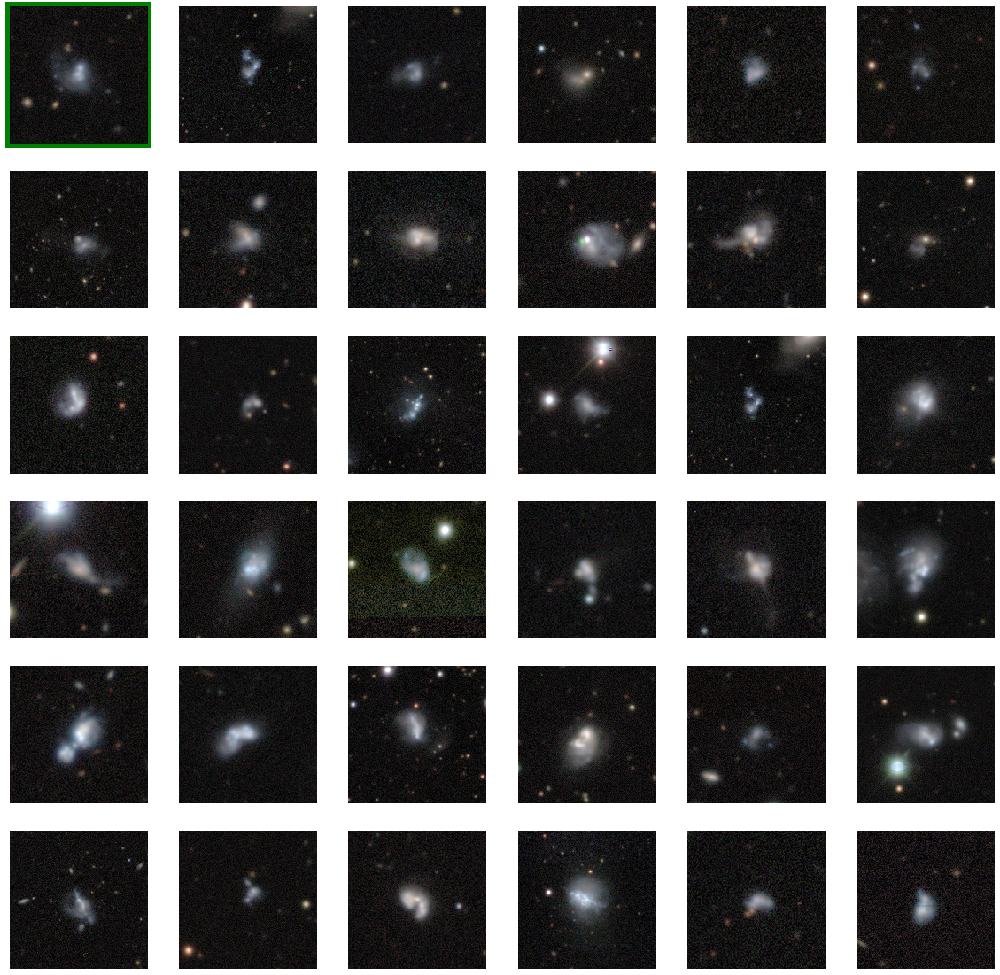

In [11]:
indices = find_neighbours(X, interesting_index, metric='euclidean')
show_galaxies(df.iloc[np.squeeze(indices)])  # first is itself

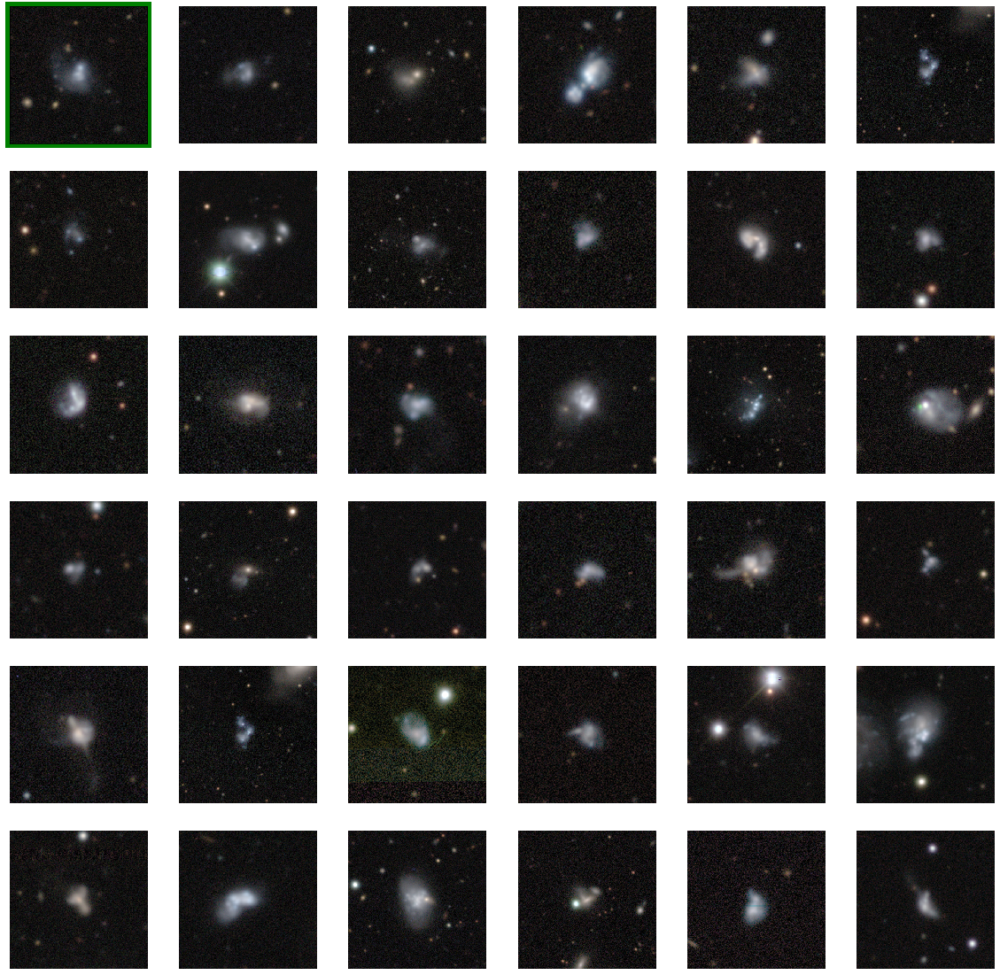

In [12]:
indices = find_neighbours(X, interesting_index)
show_galaxies(df.iloc[np.squeeze(indices)])  # first is itself

In [39]:
not_hoag = "J120143.46+001059.2"
not_hoag_index = np.argmax(df['iauname'] == not_hoag)

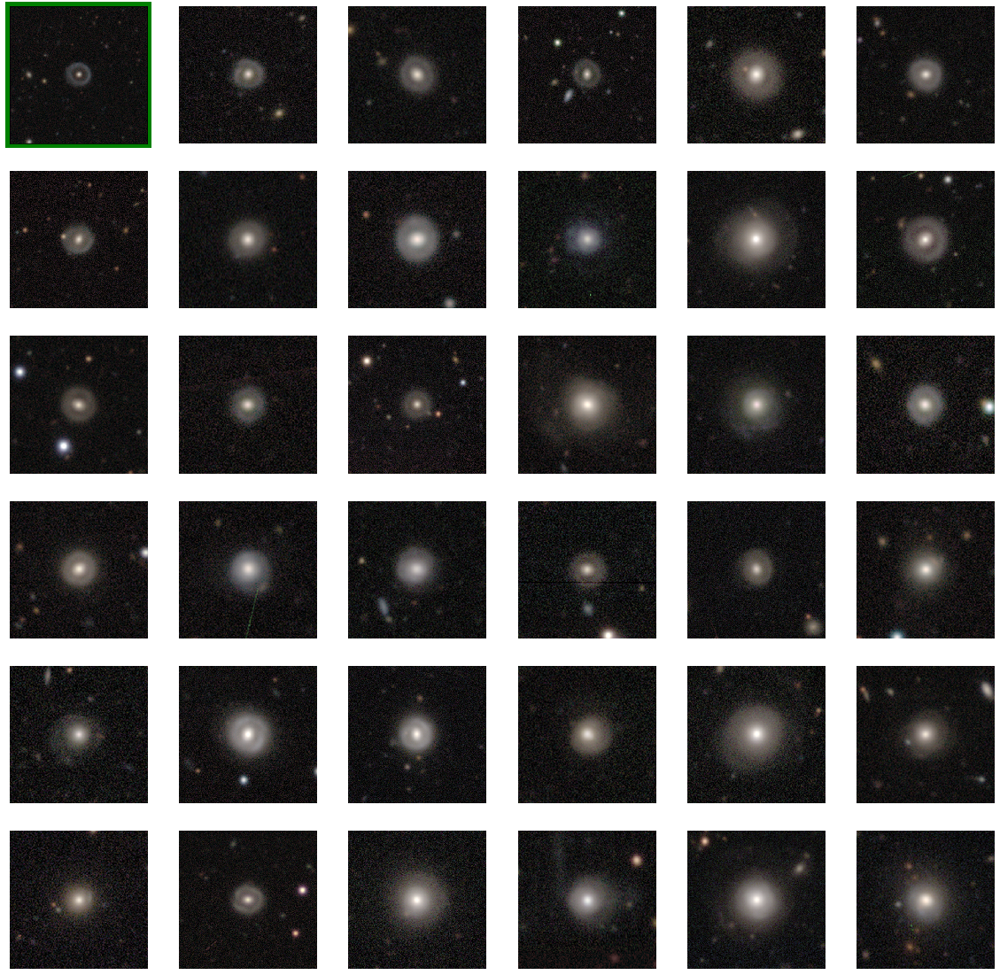

In [40]:
indices = find_neighbours(X, not_hoag_index, metric='euclidean')
show_galaxies(df.iloc[np.squeeze(indices)])  # first is itself

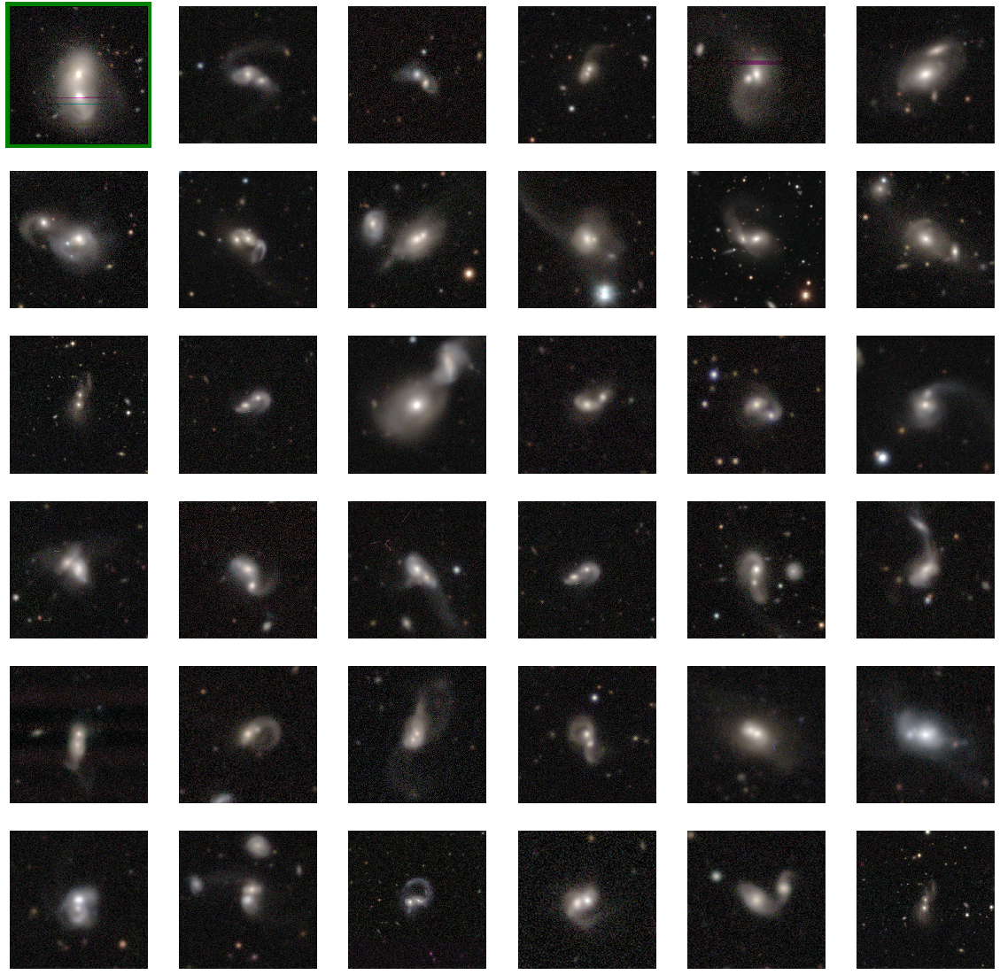

In [42]:
overlap = "J114222.33+084611.5"
overlap_index = np.argmax(df['iauname'] == overlap)
indices = find_neighbours(X, overlap_index)
show_galaxies(df.iloc[np.squeeze(indices)])  # first is itself